In [1]:
%matplotlib inline

import numpy as np
import matplotlib.pylab as plt

import astropy.io.fits as fits

import glob

import os

from photutils.aperture import EllipticalAperture
from photutils.aperture import EllipticalAnnulus
from photutils import aperture_photometry

from matplotlib.colors import LogNorm

# Importing fits files for M101:

In [2]:
# filepath just for M101 observations:

filepath = glob.glob('./fits/ARCSAT/M101*.fits')

In [3]:
# getting copies of data and headers for M101; prints filenames as well as headers for first two:

data_array = []
header_array = []

for file in filepath:

    hdu = fits.open(file)
    data_array.append(hdu[0].data.copy())
    header_array.append(hdu[0].header.copy())
    print(os.path.basename(file))

hdu.close()
header_array[0]

M101_halpha_20180519_065831.fits
M101_sdss_g_20180519_061809.fits
M101_sdss_i_20180519_063906.fits
M101_sdss_r_20180519_064852.fits
M101_sdss_u_20180519_053518.fits
M101_sdss_u_20180519_054526.fits
M101_sdss_u_20180519_060125.fits
M101_sdss_z_20180519_062813.fits


SIMPLE  =                    T                                                  
BITPIX  =                   16 /8 unsigned int, 16 & 32 int, -32 & -64 real     
NAXIS   =                    2 /number of axes                                  
NAXIS1  =                 4096 /fastest changing axis                           
NAXIS2  =                 4096 /next to fastest changing axis                   
BSCALE  =   1.0000000000000000 /physical = BZERO + BSCALE*array_value           
BZERO   =   32768.000000000000 /physical = BZERO + BSCALE*array_value           
DATE-OBS= '2018-05-19T06:58:45' / [ISO 8601] UTC date/time of exposure start    
EXPTIME =   7.00000000000E+002 / [sec] Duration of exposure                     
EXPOSURE=   7.00000000000E+002 / [sec] Duration of exposure                     
SET-TEMP=  -28.899999618530273 /CCD temperature setpoint in C                   
CCD-TEMP=  -28.826745750000001 /CCD temperature at start of exposure in C       
XPIXSZ  =   9.00000000000000

In [4]:
plt.style.use('default')

In [5]:
from astropy.visualization import make_lupton_rgb

# Okay now to actually import the biases and flats:

In [6]:
# Night 1 Bias Filepath:

filepath2 = glob.glob('./fits/ARCSAT/Bias*.fits')

In [7]:
# Retrieves night 1 bias stuff; prints filenames & returns avg. bias count.

biasdata_array = []
biasheader_array = []
bias_avgs = []

for file in filepath2:

    hdu1 = fits.open(file)
    biasdata_array.append(hdu1[0].data.copy())
    biasheader_array.append(hdu1[0].header.copy())
    print(os.path.basename(file))
    bdata = fits.getdata(file)
    bias_avgs.append(np.mean(bdata))

super_bias = np.mean(bias_avgs)

hdu1.close()
print(super_bias)

Bias_BIN1_20180519_015217.fits
Bias_BIN1_20180519_015240.fits
Bias_BIN1_20180519_015302.fits
Bias_BIN1_20180519_015326.fits
Bias_BIN1_20180519_015349.fits
Bias_BIN1_20180519_015412.fits
Bias_BIN1_20180519_015434.fits
Bias_BIN1_20180519_015458.fits
Bias_BIN1_20180519_015521.fits
Bias_BIN1_20180519_015545.fits
Bias_BIN1_20180519_015608.fits
Bias_BIN1_20180519_015632.fits
1132.7215329160292


In [8]:
# Filepath for night 1 dome flats.

filepath3 = glob.glob('./fits/ARCSAT/domeflat*.fits')

In [9]:
# Getting dome flat stuff:

domeflatdata_array = []
domeflatheader_array = []

for file in filepath3:

    hdu2 = fits.open(file)
    domeflatdata_array.append(hdu2[0].data.copy())
    domeflatheader_array.append(hdu2[0].header.copy())
    print(os.path.basename(file))

hdu2.close()

domeflat_halpha_001.fits
domeflat_sdss_g_001.fits
domeflat_sdss_i_001.fits
domeflat_sdss_i_002.fits
domeflat_sdss_i_003.fits
domeflat_sdss_r_001.fits
domeflat_sdss_r_002.fits
domeflat_sdss_r_003.fits
domeflat_sdss_z_001.fits


In [10]:
# sdss_i avg. flat count (just for the hell of it):

iflat_avg = np.mean(domeflatdata_array[2:5])
print(iflat_avg)

19477.48177142938


# Now for actual data reduction (of M101):

In [11]:
# subtract biases - from everything,
# divide flats

In [12]:
from sklearn.preprocessing import normalize

In [13]:
# making average i band flat:

i_avg_flats = (domeflatdata_array[2] + domeflatdata_array[3] + domeflatdata_array[4])/3

In [14]:
i_avg_flats_minusbias = i_avg_flats - super_bias

In [15]:
# normalizing i band flat:

n1_domeflatnorm_i = normalize(i_avg_flats_minusbias)
np.mean(n1_domeflatnorm_i)

0.015623393436249867

In [16]:
reduced_i_M101 = (data_array[2] - super_bias)/(n1_domeflatnorm_i)
reduced_i_M101

array([[ 4269.68889868,  4739.82600322,  4744.31316122, ...,
         4776.76079395,  3563.75952247,  4260.38231272],
       [ 5389.24312102,  3881.457696  ,  4834.53018774, ...,
         2898.35415848,  4156.70533321,  3333.68846239],
       [ 3926.76478652,  9814.19365302,  5048.49683513, ...,
         3964.97473334,  3162.70239826,  5192.24170855],
       ...,
       [11120.57301402,  9141.00994888,  9243.13793798, ...,
         5121.14743025,  3604.9580428 ,  5090.51288361],
       [ 8619.71642374, 10111.13179655,  9891.87565566, ...,
         6161.5484202 ,  4842.96327386,  5051.69946032],
       [11396.51908045, 10710.74463621, 10481.64053446, ...,
         5949.909881  ,  5637.3332171 ,  7448.66353912]])

In [17]:
# Guess I should just write another loop here...ah well.

In [18]:
r_avg_flats = (domeflatdata_array[5] + domeflatdata_array[6] + domeflatdata_array[7])/3

In [19]:
rflat_minusbias = r_avg_flats - super_bias

In [20]:
n1_domeflatnorm_r = normalize(rflat_minusbias)

In [21]:
reduced_r_M101 = (data_array[3] - super_bias)/(n1_domeflatnorm_r)

In [22]:
# g band

g_avg_flats_minusbias = domeflatdata_array[1] - super_bias

n1_domeflatnorm_g = normalize(g_avg_flats_minusbias)

reduced_g_M101 = (data_array[3] - super_bias)/(n1_domeflatnorm_g)

In [23]:
# z band

z_avg_flats_minusbias = domeflatdata_array[-1] - super_bias

n1_domeflatnorm_z = normalize(z_avg_flats_minusbias)

reduced_z_M101 = (data_array[7] - super_bias)/(n1_domeflatnorm_z)

In [24]:
# H alpha narrowband

halpha_avg_flats_minusbias = domeflatdata_array[0] - super_bias

n1_domeflatnorm_halpha = normalize(halpha_avg_flats_minusbias)

reduced_halpha_M101 = (data_array[0] - super_bias)/(n1_domeflatnorm_halpha)

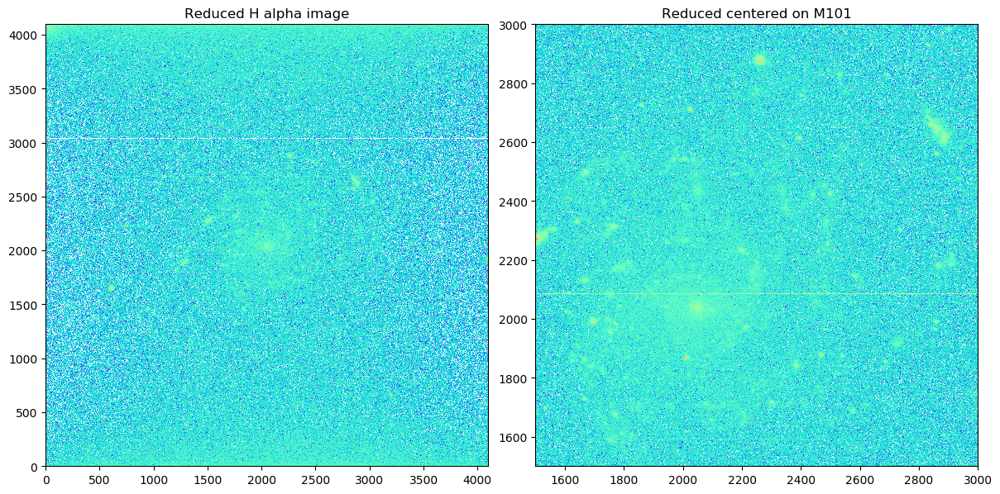

In [25]:
fig, ax = plt.subplots(1,2)

fig.set_size_inches(12,6)

fig.tight_layout()

ax[1].axis((1500,3000,1500,3000))

ax[0].imshow(reduced_halpha_M101, norm=LogNorm(), origin='lower', cmap='rainbow')
ax[1].imshow(reduced_halpha_M101, norm=LogNorm(), origin='lower', cmap='rainbow')

ax[0].set_title('Reduced H alpha image')
ax[1].set_title('Reduced centered on M101');

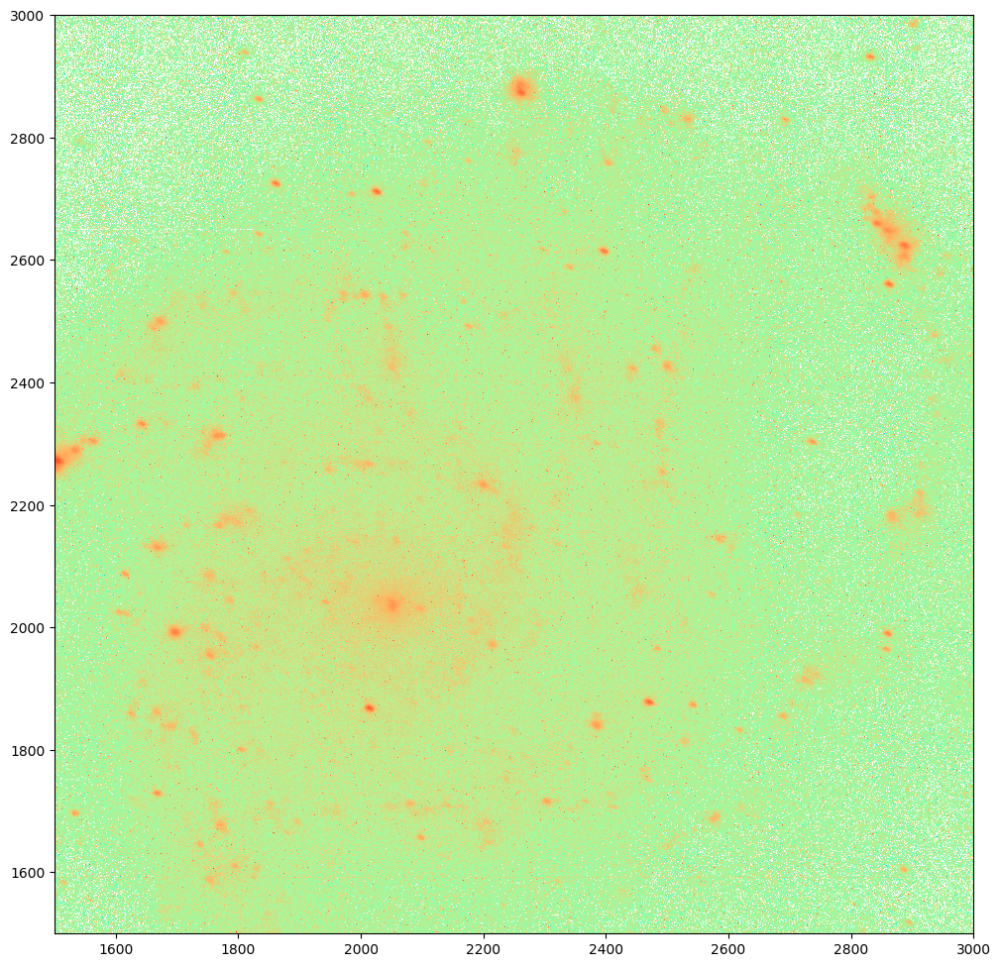

In [26]:
# look at those pockets of star formation...

fig,ax = plt.subplots(1,1)

fig.set_size_inches(10,10)
fig.tight_layout()

ax.axis((1500,3000,1500,3000))

ax.imshow(reduced_g_M101-np.mean(reduced_g_M101), norm=LogNorm(), cmap='rainbow')
ax.imshow(reduced_r_M101-np.mean(reduced_z_M101), norm=LogNorm(), cmap='rainbow')
ax.imshow(reduced_halpha_M101-np.mean(reduced_halpha_M101), norm=LogNorm(), cmap='rainbow');

# Now for sky-subtraction:

In [27]:
coord = [2051.134, 2053.268]

In [28]:
# i band

In [29]:
ApertureScience = EllipticalAperture(coord, a=850, b=700, theta=(np.pi/4))

In [30]:
ap_pho = aperture_photometry(reduced_i_M101, ApertureScience, method='exact')
ap_pho

id,xcenter,ycenter,aperture_sum
,pix,pix,
int64,float64,float64,float64
1,2051.134,2053.268,10694180433.847631


In [31]:
count = []

count_a = ap_pho['aperture_sum']
count_per_area = (count_a / (ApertureScience.area())) # counts / pixel squared
count.append(count_per_area)
print(count)

[<Column name='aperture_sum' dtype='float64' length=1>
5721.114885255397]


In [32]:
# That could be right.

In [33]:
coord2 = [540.906, 3200.755]

In [34]:
ApertureCircle = EllipticalAperture(coord2, a=5, b=5, theta=0)

In [35]:
circle_pho = aperture_photometry(reduced_i_M101, ApertureCircle, method='exact')

In [36]:
# sky-subtracting

In [37]:
# find sky count

sky_count = []

count_sky = circle_pho['aperture_sum']
sky_count_per_area = (count_sky / (ApertureCircle.area())) # counts / pixel squared
sky_count.append(sky_count_per_area)
print(sky_count)

[<Column name='aperture_sum' dtype='float64' length=1>
4109.79324045144]


In [38]:
# getting count for sky in main aperture
#sky = []

#sky.append(sky_count[0]*ApertureScience.area())
#skyless_i = ap_pho['aperture_sum'] - sky
skyless_i = reduced_i_M101 - sky_count

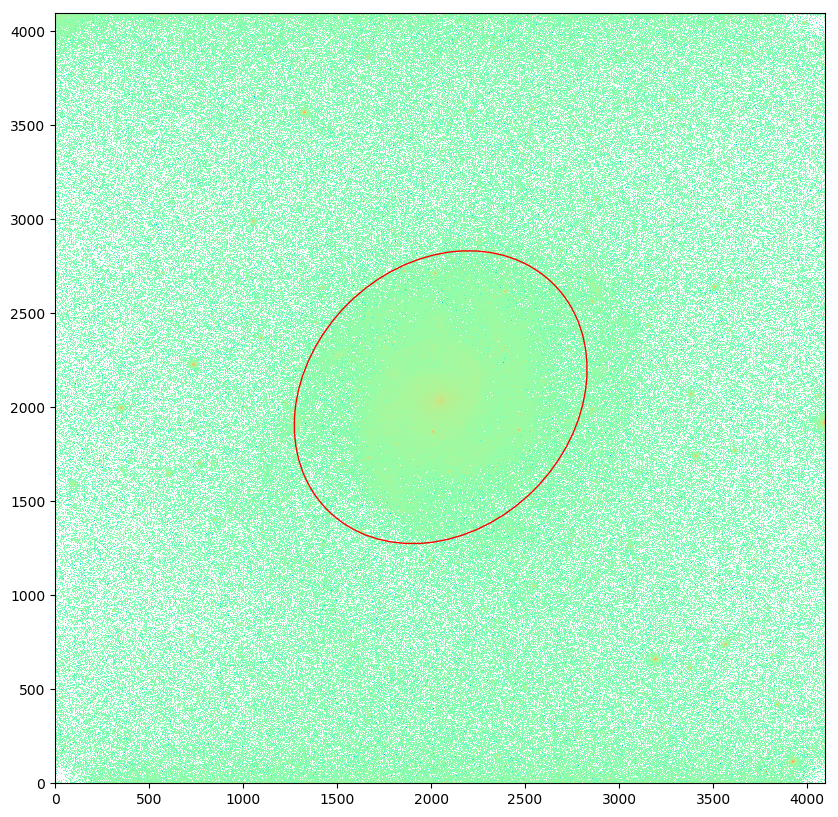

In [39]:
fig,ax = plt.subplots(1,1)                 
fig.set_size_inches(10,10)
fig.set_tight_layout

plt.imshow(skyless_i, norm=LogNorm(), alpha=1.0, cmap='rainbow', origin='lower')
EllipticalAperture.plot(ApertureScience, color="r");

In [40]:
# seems to have worked pretty well, as far as I can tell

In [41]:
# g band

In [42]:
gap_pho = aperture_photometry(reduced_g_M101, ApertureScience, method='exact')
gap_pho

id,xcenter,ycenter,aperture_sum
,pix,pix,
int64,float64,float64,float64
1,2051.134,2053.268,13778724524.726349


In [43]:
gcount = []

gcount_a = gap_pho['aperture_sum']
gcount_per_area = (gcount_a / (ApertureScience.area())) # counts / pixel squared
gcount.append(gcount_per_area)
print(gcount)

[<Column name='aperture_sum' dtype='float64' length=1>
7371.267622224285]


In [44]:
gcircle_pho = aperture_photometry(reduced_g_M101, ApertureCircle, method='exact')

In [45]:
gsky_count = []

gcount_sky = gcircle_pho['aperture_sum']
gsky_count_per_area = (gcount_sky /ApertureCircle.area()) # counts / pixel squared
gsky_count.append(gsky_count_per_area)
print(gsky_count)

[<Column name='aperture_sum' dtype='float64' length=1>
4704.905545496628]


In [46]:
skyless_g = reduced_g_M101 - gsky_count

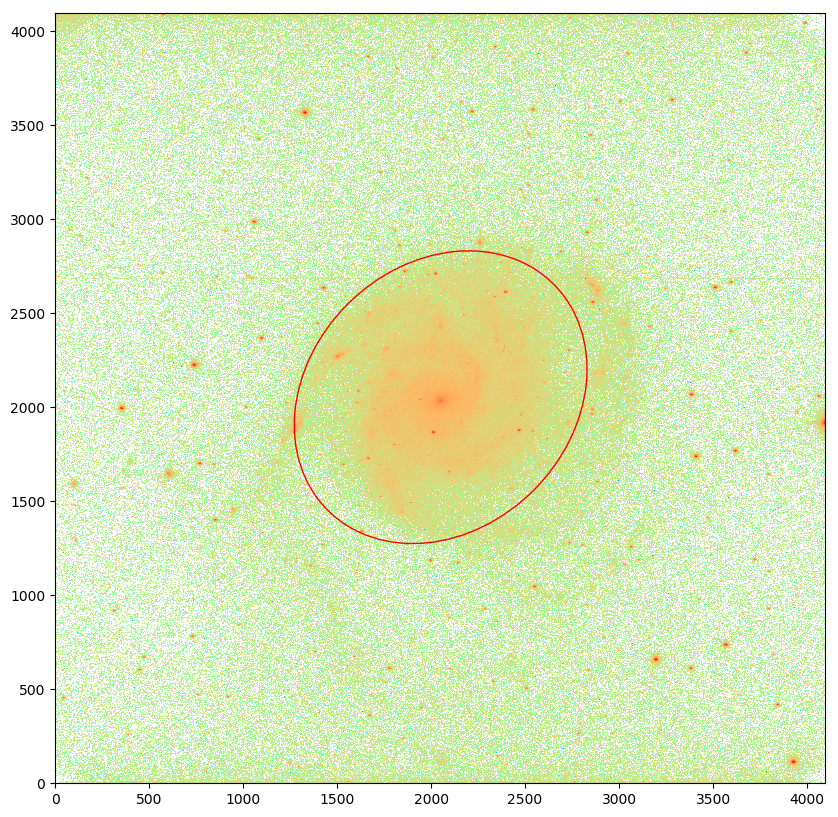

In [47]:
fig,ax = plt.subplots(1,1)                 
fig.set_size_inches(10,10)
fig.set_tight_layout

plt.imshow(skyless_g, norm=LogNorm(), alpha=1.0, cmap='rainbow', origin='lower')
EllipticalAperture.plot(ApertureScience, color="r");

In [48]:
# halpha

In [49]:
halphaap_pho = aperture_photometry(reduced_halpha_M101, ApertureScience, method='exact')
halphaap_pho

id,xcenter,ycenter,aperture_sum
,pix,pix,
int64,float64,float64,float64
1,2051.134,2053.268,1974562018.2714036


In [50]:
hacount = []

hacount_a = halphaap_pho['aperture_sum']
hacount_per_area = (hacount_a / (ApertureScience.area())) # counts / pixel squared
hacount.append(hacount_per_area)
print(hacount)

[<Column name='aperture_sum' dtype='float64' length=1>
1056.3405231912716]


In [51]:
hacircle_pho = aperture_photometry(reduced_halpha_M101, ApertureCircle, method='exact')

In [52]:
hasky_count = []

hacount_sky = hacircle_pho['aperture_sum']
hasky_count_per_area = (hacount_sky /ApertureCircle.area()) # counts / pixel squared
hasky_count.append(hasky_count_per_area)
print(hasky_count)

[<Column name='aperture_sum' dtype='float64' length=1>
625.4779729521381]


In [53]:
skyless_halpha = reduced_halpha_M101 - hasky_count

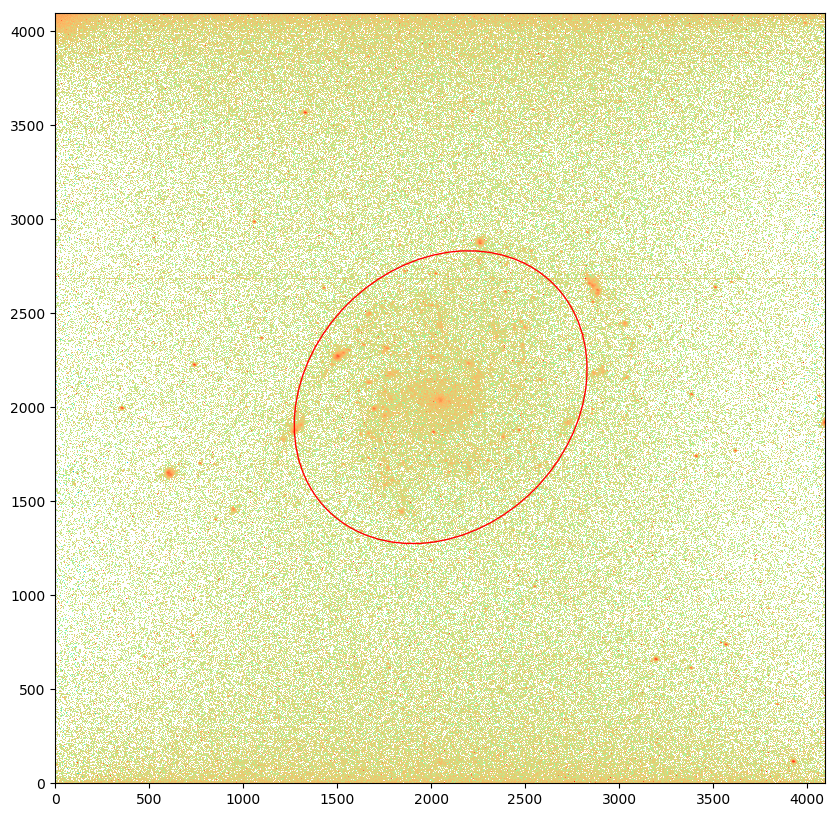

In [54]:
fig,ax = plt.subplots(1,1)                 
fig.set_size_inches(10,10)
fig.set_tight_layout

plt.imshow(skyless_halpha, norm=LogNorm(), alpha=1.0, cmap='rainbow', origin='lower')
EllipticalAperture.plot(ApertureScience, color="r");

In [55]:
# r band

In [56]:
rap_pho = aperture_photometry(reduced_r_M101, ApertureScience, method='exact')
rap_pho

id,xcenter,ycenter,aperture_sum
,pix,pix,
int64,float64,float64,float64
1,2051.134,2053.268,13642365130.833843


In [57]:
rcount = []

rcount_a = rap_pho['aperture_sum']
rcount_per_area = (rcount_a / (ApertureScience.area())) # counts / pixel squared
rcount.append(rcount_per_area)
print(rcount)

[<Column name='aperture_sum' dtype='float64' length=1>
7298.3188102074555]


In [58]:
rcircle_pho = aperture_photometry(reduced_r_M101, ApertureCircle, method='exact')

In [59]:
rsky_count = []

rcount_sky = rcircle_pho['aperture_sum']
rsky_count_per_area = (rcount_sky /ApertureCircle.area()) # counts / pixel squared
rsky_count.append(rsky_count_per_area)
print(rsky_count)

[<Column name='aperture_sum' dtype='float64' length=1>
4722.35617433772]


In [60]:
skyless_r = reduced_r_M101 - rsky_count

In [61]:
# z band

In [62]:
zcircle_pho = aperture_photometry(reduced_z_M101, ApertureCircle, method='exact')

In [63]:
zsky_count = []

zcount_sky = zcircle_pho['aperture_sum']
zsky_count_per_area = (zcount_sky /ApertureCircle.area()) # counts / pixel squared
zsky_count.append(zsky_count_per_area)
print(zsky_count)

[<Column name='aperture_sum' dtype='float64' length=1>
4367.400292720307]


In [64]:
skyless_z = reduced_z_M101 - zsky_count

In [65]:
# Making another plot for fun

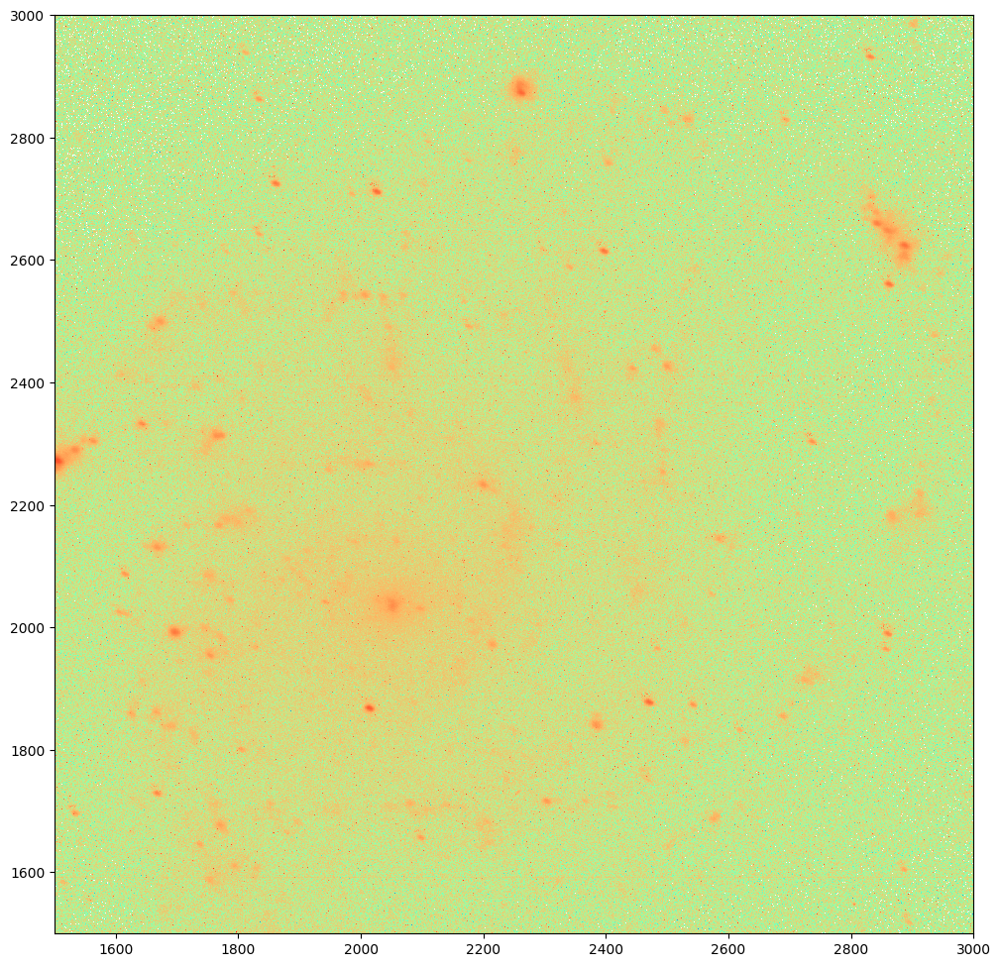

In [66]:
fig,ax = plt.subplots(1,1)

fig.set_size_inches(10,10)
fig.tight_layout()

ax.axis((1500,3000,1500,3000))

ax.imshow(skyless_g, norm=LogNorm(), cmap='rainbow')
ax.imshow(skyless_r, norm=LogNorm(), cmap='rainbow')
ax.imshow(skyless_i, norm=LogNorm(), cmap='rainbow')
ax.imshow(skyless_z, norm=LogNorm(), cmap='rainbow')
ax.imshow(skyless_halpha, norm=LogNorm(), cmap='rainbow');

In [67]:
# Okay, now on to the aperture photometry:

In [68]:
zap_pho = aperture_photometry(skyless_z, ApertureScience, method='exact')
gap_pho = aperture_photometry(skyless_g, ApertureScience, method='exact')
iap_pho = aperture_photometry(skyless_i, ApertureScience, method='exact')
rap_pho = aperture_photometry(skyless_r, ApertureScience, method='exact')
hap_pho = aperture_photometry(skyless_halpha, ApertureScience, method='exact')

# Finally time for a little analysis!

In [69]:
elliptical_apertures = [hap_pho, gap_pho, rap_pho, iap_pho, zap_pho]

In [70]:
ap_keys = ['Ha', 'g', 'r', 'i', 'z']
counts = []

for aperture in elliptical_apertures:
    count = aperture['aperture_sum']
    # really shouldn't have called this flux, but oh well, too late now:
    flux = count / ApertureScience.area()
    counts.append(flux)
    print(count)

  aperture_sum  
----------------
805388800.410243
   aperture_sum  
-----------------
4984090989.674519
   aperture_sum  
-----------------
4815112049.198246
   aperture_sum   
------------------
3011959163.9223614
   aperture_sum   
------------------
1291608861.9827933


In [71]:
# messing around here I ended up with what's actually a pretty useful false color image:

In [72]:
skyless_color = make_lupton_rgb(skyless_z, skyless_i, skyless_halpha, stretch=2000)

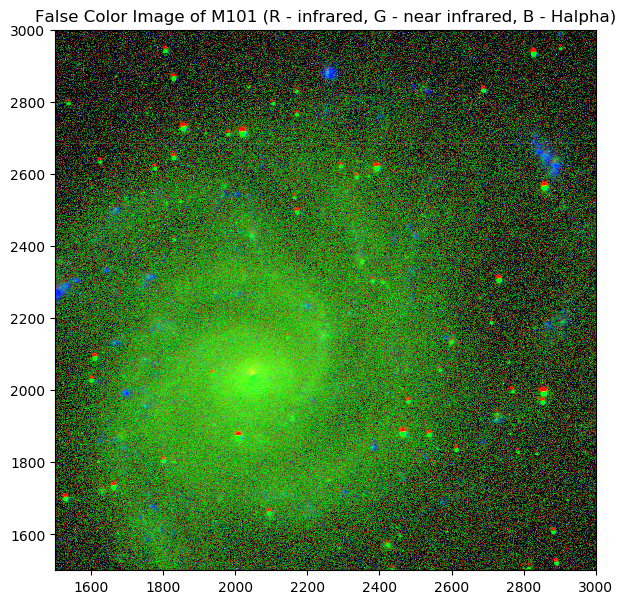

In [73]:
fig, ax = plt.subplots(1,1)

fig.set_size_inches(12,6)

fig.tight_layout()

ax.axis((1500,3000,1500,3000))

ax.imshow(skyless_color, norm=LogNorm(vmin=200), origin='lower', cmap='rainbow')
ax.set_title('False Color Image of M101 (R - infrared, G - near infrared, B - Halpha)');

In [74]:
# getting a reduced blue (UV actually) image here, even though there's no flats for it, just for
# the purpose of pretty pictures

In [75]:
reduced_u_M101 = (data_array[6] - super_bias)/(n1_domeflatnorm_g)

ucircle_pho = aperture_photometry(reduced_u_M101, ApertureCircle, method='exact')

usky_count = []

ucount_sky = ucircle_pho['aperture_sum']
usky_count_per_area = (ucount_sky /ApertureCircle.area()) # counts / pixel squared
usky_count.append(usky_count_per_area)

skyless_u = reduced_u_M101 - usky_count

In [76]:
real_sort_of_skyless_color = make_lupton_rgb(skyless_r, skyless_g, skyless_u, stretch=2000)

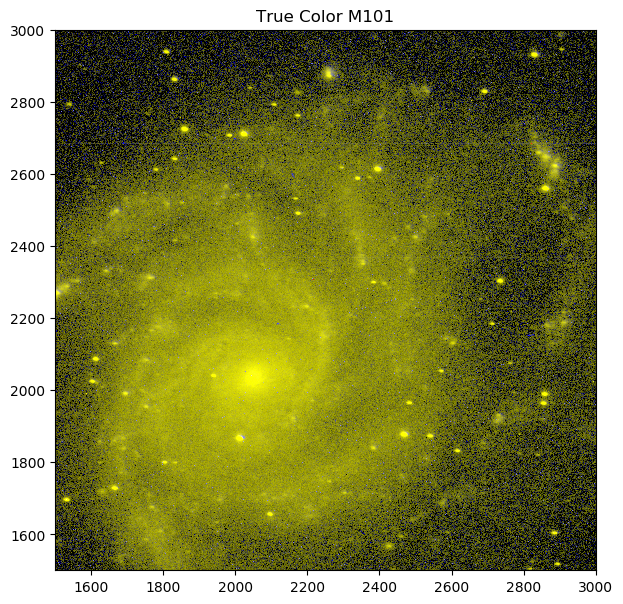

In [77]:
fig, ax = plt.subplots(1,1)

fig.set_size_inches(12,6)

fig.tight_layout()

ax.axis((1500,3000,1500,3000))

ax.imshow(real_sort_of_skyless_color, norm=LogNorm(vmin=200), origin='lower', cmap='rainbow')
ax.set_title('True Color M101');

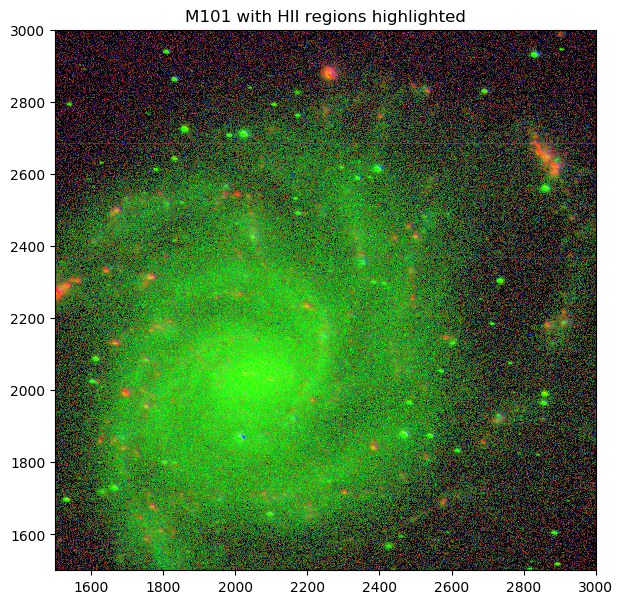

In [78]:
justfalse_skyless_color = make_lupton_rgb(3*skyless_halpha, skyless_g, 2*skyless_u, stretch=3000)

fig, ax = plt.subplots(1,1)

fig.set_size_inches(12,6)

fig.tight_layout()

ax.axis((1500,3000,1500,3000))

ax.imshow(justfalse_skyless_color, norm=LogNorm(vmin=200), origin='lower', cmap='rainbow')
ax.set_title('M101 with HII regions highlighted');

# Magnitudes:

In [79]:
# m_x = -2.5 x log(counts/exp. time) + ZMAG

filt_keys = ['Ha', 'g', 'r', 'i', 'z']

In [80]:
filter_indices = [header_array[0], header_array[1], header_array[3], header_array[2], header_array[-1]]

In [81]:
exp_times = []
z_mags = []

for i in filter_indices:
    exp_times.append(i['EXPTIME'])
    z_mags.append(i['ZMAG'])

In [85]:
keys = [0, 1, 2, 3, 4]
mags = []

for i in keys:
    
    mag = -2.5 * np.log([counts[i]/exp_times[i]]) + z_mags[i]
    mags.append(mag)
    #print(filt_keys[i], counts[i], exp_times[i], counts[i]/exp_times[i], mag)
    print(filt_keys[i], mag)

Ha [[18.48137366]]
g [[15.75709627]]
r [[16.12532338]]
i [[16.74994816]]
z [[17.54821992]]


In [87]:
# Looks right enough. Dim, but not unreasonably so.

In [88]:
# To hell with it, I'll just look up the distance to M101 to get the absolute magnitudes.

In [89]:
def abs_mag(apparent_mag, D):
    '''Returns absolute magnitude given apparent magnitude & a distance in Mpc. Assumes a 0.02 extinction constant
    (assuming a constant 0.02 because actual values do not change much beyond +- 0.01 and the value is so small
    I could have just left it out without losing anything, given other uncertainty).'''
    Mag = apparent_mag - 5*np.log(D) - 25 - 0.02
    return(Mag)

In [92]:
abs_mags = []
print('Filter', 'app mag', 'abs mag')
for mag in mags:
    M = abs_mag(mag,6.855)
    abs_mags.append(M)
    print(filt_keys[mags.index(mag)], mag, M)

Filter app mag abs mag
Ha [[18.48137366]] [[-16.1635179]]
g [[15.75709627]] [[-18.8877953]]
r [[16.12532338]] [[-18.51956819]]
i [[16.74994816]] [[-17.89494341]]
z [[17.54821992]] [[-17.09667165]]


# Last step for this notebook: write reduced images to new fits files for further analysis elsewhere:

In [111]:
# Ha
hdu = fits.PrimaryHDU(skyless_halpha, header=header_array[0])
hdu.writeto('./fits/reducedhalpha.fits')

# g
hdu = fits.PrimaryHDU(skyless_g, header=header_array[1])
hdu.writeto('./fits/reducedg.fits')

# r
hdu = fits.PrimaryHDU(skyless_r, header=header_array[3])
hdu.writeto('./fits/reducedr.fits')

# i
hdu = fits.PrimaryHDU(skyless_i, header=header_array[2])
hdu.writeto('./fits/reducedi.fits')

# z
hdu = fits.PrimaryHDU(skyless_z, header=header_array[-1])
hdu.writeto('./fits/reducedz.fits')